# <center>Network Science</center>

Home Assignment #2: Community Detection

#### <hr /> General Information

**Due Date:** 03.06.2020 21:00 <br>
**Late submission policy:** -1 points per day <br>


Please send your reports to <iakarpov@hse.ru> with message subject of the following structure: <br>
**[HSE SNA Magolego 2020] *{LastName}* *{First Name}* HW_2*

Support your computations with figures and comments. <br>
If you are using IPython Notebook you may use this file as a starting point of your report.

if your network is too big and takes too much time to compute( > 2000 nodes), use `cores` algorithm to make it smaller <br>

## Problems

### Task 1. Network community detection

Use any existing network from our [classes](https://dl.dropboxusercontent.com/s/8eo1sjfhu5spb0f/vk.tsv?dl=1)  or your couse project

1.1. Using Gephi or [NetworkX](https://networkx.github.io/documentation/stable/reference/algorithms/community.html) implement community detection task, using one of the possible algorithms: modularity, label propagation, girvan newman, louvain <br>
1.2. Vizualize your graph in gephi, networkX or grahistry and give a short interpretation <br>


In [1]:
pip install community

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install python-louvain

Note: you may need to restart the kernel to use updated packages.


In [1]:
#загрузка необходимых для работы библиотек

import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


from networkx.algorithms import community
from networkx.algorithms.community import LFR_benchmark_graph
from community import community_louvain
from networkx.algorithms.community import greedy_modularity_communities
from networkx.algorithms.community import label_propagation_communities
from networkx.algorithms.community import asyn_lpa_communities
from networkx.algorithms.community import greedy_modularity_communities
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import mutual_info_score
from sklearn.metrics import adjusted_mutual_info_score
from collections import defaultdict
from networkx.algorithms import community as nxcom

from IPython.display import display, HTML, display_pretty
import os


%matplotlib inline

In [2]:
# создание массива с данными из файла vk.tsv
df = pd.read_csv('vk.tsv',sep = '\t')
df.head()

,Unnamed: 0,Friends,ID,Name
0,0,VK_4766099,VK_97803804,Никита Кузнецов
1,1,VK_5227712,VK_97803804,Никита Кузнецов
2,2,VK_11047376,VK_97803804,Никита Кузнецов
3,3,VK_11079816,VK_97803804,Никита Кузнецов
4,4,VK_14492163,VK_97803804,Никита Кузнецов


In [3]:
#находим уникальные значения id, чтобы выбрать 3-5 seed
ids = list(df["ID"].unique())
#формируем массив с seed и их друзьями 
df1=df[df.ID.astype(str).isin(['VK_43555697','VK_65606427', 'VK_382481084'])]
df1.head()

,Unnamed: 0,Friends,ID,Name
682,682,VK_14603,VK_65606427,Полина Быкова
683,683,VK_369694,VK_65606427,Полина Быкова
684,684,VK_498989,VK_65606427,Полина Быкова
685,685,VK_1231116,VK_65606427,Полина Быкова
686,686,VK_1499191,VK_65606427,Полина Быкова


In [4]:
list(df1["Name"].unique())

['Полина Быкова', 'Rišards Jurans', 'Лена Рыбкина']

In [5]:
#список уникальных друзей выбранных seeds
friends = list(df1["Friends"].unique())

In [6]:
#создание массива в котором есть друзья выбранных seed
df2=df[df.ID.astype(str).isin(friends)]
df2.head()

,Unnamed: 0,Friends,ID,Name
682,682,VK_14603,VK_65606427,Полина Быкова
683,683,VK_369694,VK_65606427,Полина Быкова
684,684,VK_498989,VK_65606427,Полина Быкова
685,685,VK_1231116,VK_65606427,Полина Быкова
686,686,VK_1499191,VK_65606427,Полина Быкова


In [7]:
id2=list(df2["Name"].unique())
#создание массива, в котором есть seeds и friends#1
result = df1.append(df2)

In [8]:
# Louvain's community detection method
def detect_communities_louvain(G):
    partition = community_louvain.best_partition(G)
    communities = list()
    for com in set(partition.values()) :
        list_nodes = [nodes for nodes in partition.keys() if partition[nodes] == com]
        communities.append(sorted(list_nodes))
    return sorted(communities)

# Girvan Newman's community detection method
def greedy_modularity_communities(G):
    communities = community.greedy_modularity_communities(G)
    return sorted(sorted(c) for c in next(communities))


# Fast Greedy community detection method
def detect_communities_greedy(G):
    communities = greedy_modularity_communities(G)
    return sorted(map(sorted, communities))

# Label propagation community detection method
def detect_communities_label_propagation(G):
    communities = list()
    #for c in asyn_lpa_communities(G):
    for c in label_propagation_communities(G):
        communities.append(sorted(c))
    return sorted(communities)

In [9]:
# Plot graph with communities, receives a list of communities, where each community is a list of nodes (ints)
def show_communities(G, communities, name='title'):
    pos=nx.spring_layout(G)
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
    plt.figure()
    plt.title(name, fontsize=20)
    aux = 0
    for community in communities:
        nx.draw_networkx_nodes(G, pos, community, node_size = 50, node_color = colors[aux])
        aux = aux + 1
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    plt.show(block=True)

In [10]:
G = nx.Graph()
count = 0

node_set = set()
#pbar = tqdm(total=len(df_2795), desc='nodes')
for index, row in result.iterrows():
    if row["ID"] not in G.nodes():
        G.add_node(row["ID"], attr_dict = {'Name':row["Name"]})
    #pbar.update(1)
#pbar = tqdm(total=len(df_2795), desc='edges')
for index, row in result.iterrows():
    if (row["ID"], row["Friends"]) not in G.edges() and (row["Friends"], row["ID"]) not in G.edges():
        G.add_edge(row["ID"], row["Friends"])    
    #pbar.update(1)

In [11]:
print(nx.info(G))
print ("Number of connected components", nx.number_connected_components(G))

Name: 
Type: Graph
Number of nodes: 1823
Number of edges: 7797
Average degree:   8.5540
Number of connected components 1


/Users/polinabykova/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


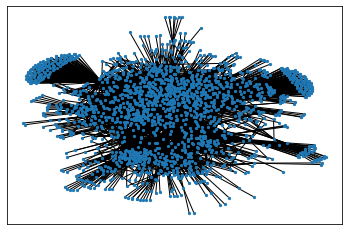

In [12]:
#получившаяся сеть в networkx
pos = nx.spring_layout(G)
nx.draw_networkx(G, pos = pos, with_labels=False, node_size = 5)

In [13]:
# matplotlib.rcParams.update({'font.size': 22})
lbls =  {n: df1["Name"]+n[:2] for n, d in G.nodes(data=True)}

In [14]:
k = dict (G.degree ())
k2 = {key: value for key, value in k.items() if value > 0}
G2 = G.subgraph(list(k2.keys()))

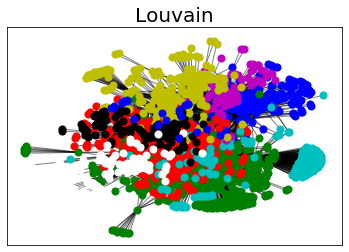

In [15]:
methodNames = [
    'Louvain'
]

methods = [
    detect_communities_louvain
]

for i in range(len(methods)):
    result = methods[i](G)
    show_communities(G, result, name=methodNames[i])

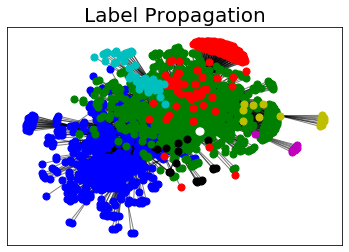

In [16]:
methodNames = [
    'Label Propagation'
]

methods = [
    detect_communities_label_propagation
]

for i in range(len(methods)):
    result = methods[i](G)
    show_communities(G, result, name=methodNames[i])

In [17]:
def convert_to_hex(rgba_color) :
    red = int(rgba_color[0]*255)
    green = int(rgba_color[1]*255)
    blue = int(rgba_color[2]*255)
    return '#%02x%02x%02x' % (red, green, blue)

In [18]:
def render_com(graph, data, ttl):

    pos = nx.kamada_kawai_layout(graph)
    # pos = nx.spring_layout(G,k=0.15,iterations=20)
    coms_n = len(data)
    cmcustom = cm.get_cmap('Paired', coms_n)

    plt.figure(1, figsize=(50,50))


    for i, com in enumerate (data):    
        nx.draw_networkx_nodes(graph, pos, com, node_size = 1000, node_color = convert_to_hex(cmcustom(i)))
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    #nx.draw_networkx_labels(graph,pos, font_size=15)
    plt.rcParams.update({'font.size': 40})
    plt.title(ttl)

    plt.show()
    pass

In [19]:
from networkx.algorithms import community as nxcom
from matplotlib import cm
from collections import defaultdict
import community as community_louvain

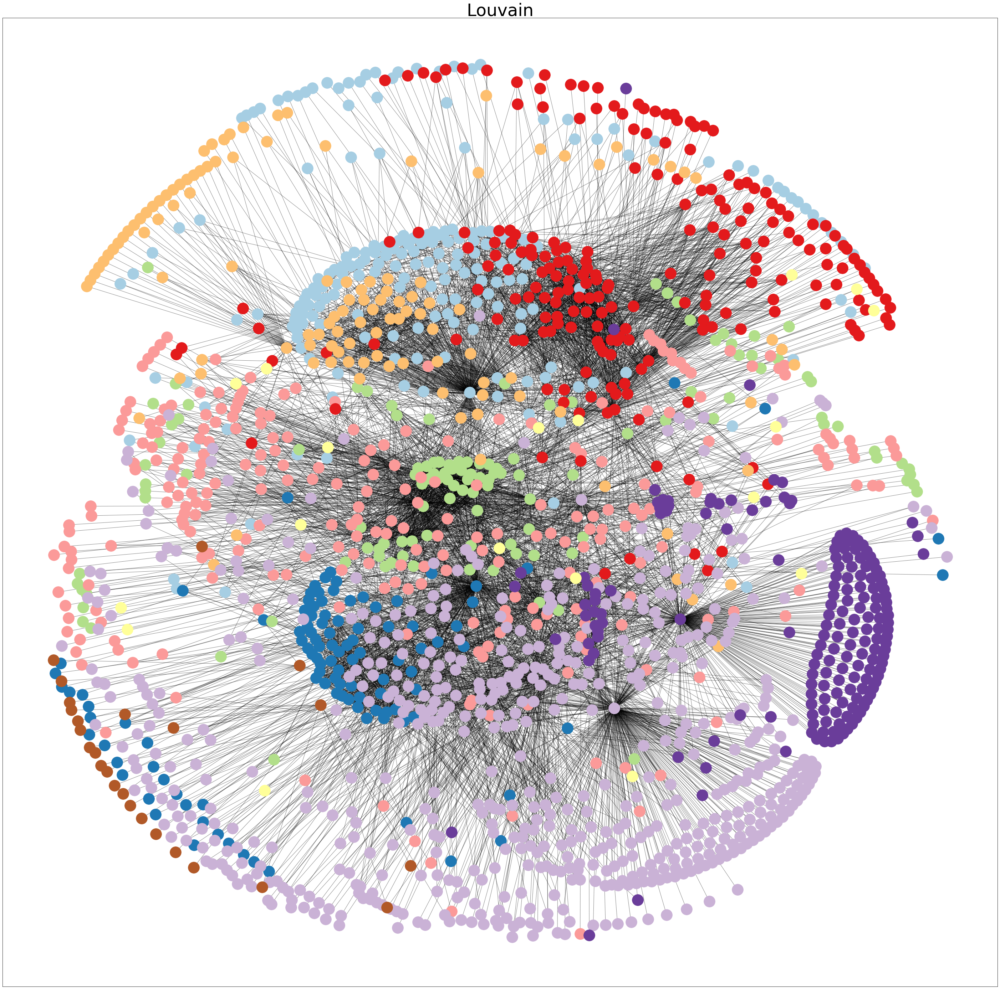

In [20]:
com_dict = defaultdict(list)
for d, z in community_louvain.best_partition(G).items(): com_dict[z].append(d)
render_com(G, com_dict.values(), "Louvain")

Сеть имеет высокую плотность, что создает сложность при описании сети, однако есть отчетливо выделяющиеся сообщества, которые представляют собой отдельный однотонные пучки.

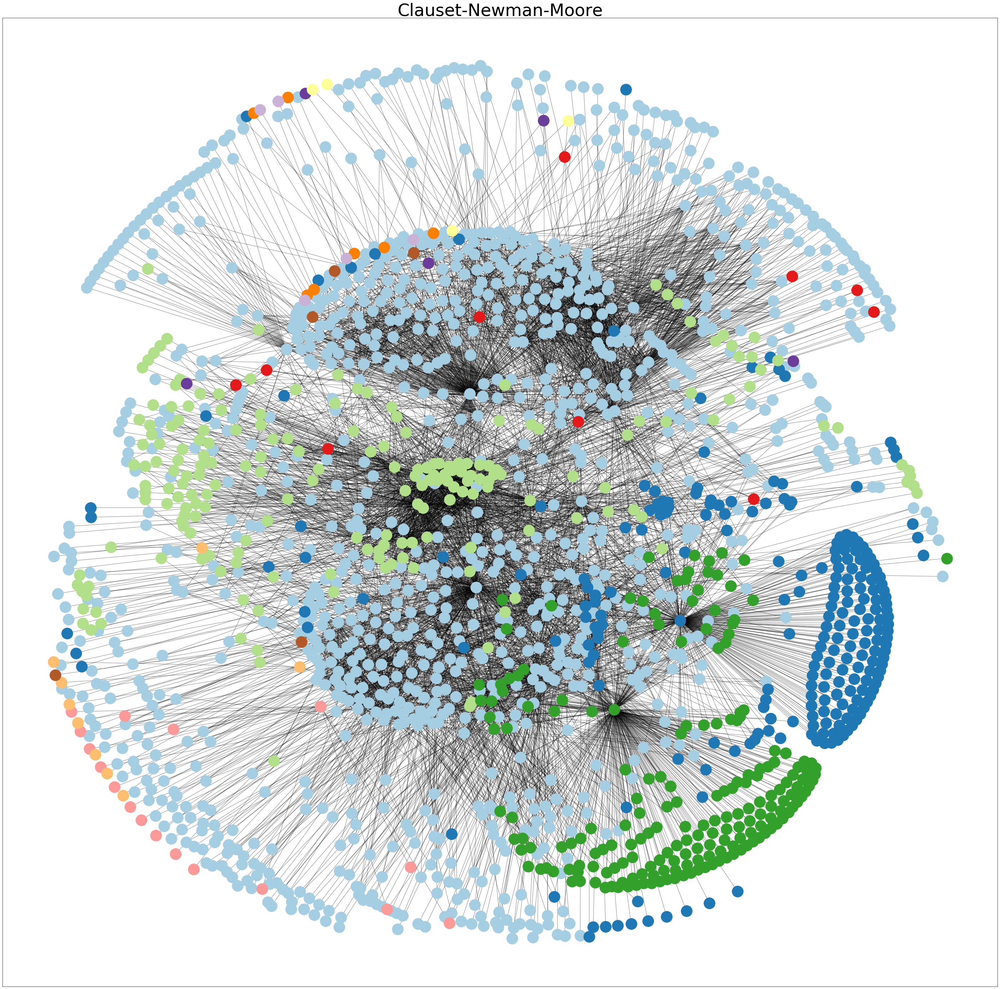

In [22]:
render_com(G, nxcom.greedy_modularity_communities(G), "Clauset-Newman-Moore")

Преобразуем наши данные 

In [23]:
k = dict (G.degree ())
k2 = {key: value for key, value in k.items() if value > 0}
G2 = G.subgraph(list(k2.keys()))

In [24]:
Gc=max(nx.connected_component_subgraphs(G),key=len)
coord=nx.spring_layout(Gc,k=0.15)

In [25]:
core=1
core=5 
new_graph=nx.k_core(Gc,k=core)

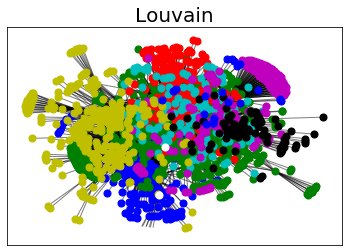

In [26]:
methodNames = [
    'Louvain'
]

methods = [
    detect_communities_louvain
]

for i in range(len(methods)):
    result = methods[i](G)
    show_communities(G, result, name=methodNames[i])

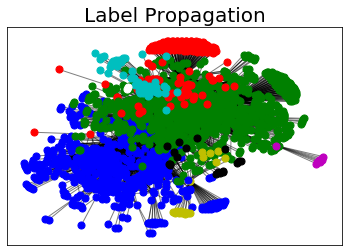

In [27]:
methodNames = [
    'Label Propagation'
]

methods = [
    detect_communities_label_propagation
]

for i in range(len(methods)):
    result = methods[i](G)
    show_communities(G, result, name=methodNames[i])

### Task 2. Assortativity and clustering

2.1. Create affinity matrix using cosine or eucledian distances (see distance.pdist from Assortativity.ipynb) <br>

In [28]:
from sklearn.cluster import AgglomerativeClustering
import scipy.spatial as spt
import numpy as np

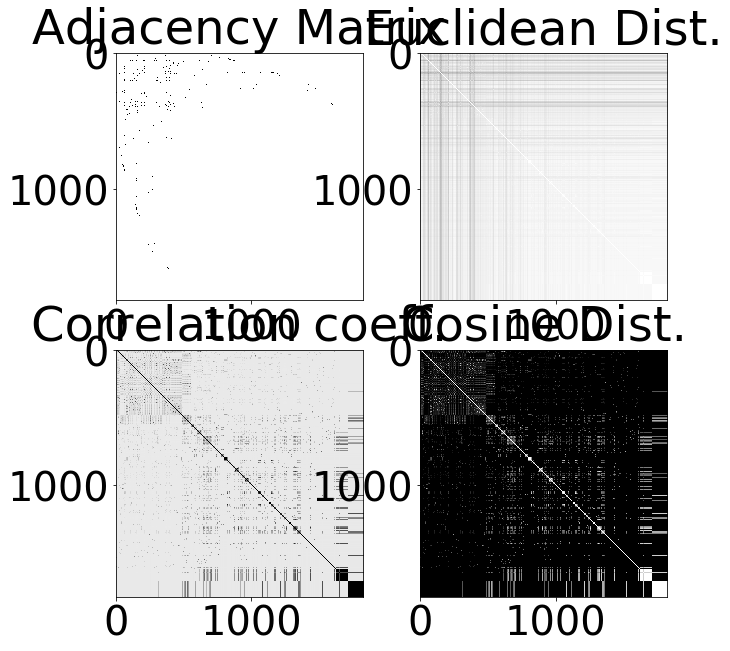

In [29]:
#G = nx.karate_club_graph()
A = nx.to_numpy_matrix(G, dtype=int)
A = np.asarray(A)

def plotDist(A):
    
    f, ax = plt.subplots(2, 2, figsize=(10,10))
    ax[0, 0].imshow(A, cmap = 'Greys', interpolation = 'None')
    ax[0, 0].set_title('Adjacency Matrix')
    
    D = np.corrcoef(A)
    ax[1, 0].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[1, 0].set_title('Correlation coeff.')
    
    dVec = spt.distance.pdist(A, metric = 'euclidean')
    D = spt.distance.squareform(dVec)
    ax[0, 1].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[0, 1].set_title('Euclidean Dist.')
    
    dVec = spt.distance.pdist(A, metric = 'cosine')
    D = spt.distance.squareform(dVec)
    ax[1, 1].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[1, 1].set_title('Cosine Dist.')
    
plotDist(A)   

2.2. Get cluster labels using one of the existing clustering algorithms to the affinity matrix (see https://scikit-learn.org/stable/modules/clustering.html) 
2.3. Vizualize your graph in gephi, networkX or grahistry and give short interpretation 

тут попытки выполнить 2.2, но не очень получилось, потому что G должен быть двумерным, а как его привести к таком виду, идей не возникло

по идее, это должно было иметь следующий вид

In [36]:
from sklearn.cluster import AgglomerativeClustering
import numpy as np
from sklearn import svm, preprocessing
from sklearn.preprocessing import MinMaxScaler
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
#x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
#X = G
#X = np.reshape(X, X.shape[0], 1)
#scaler = MinMaxScaler(feature_range=(0,1))
#scaled_data = scaler.fit_transform(X)
#X = preprocessing.scale(dataset)
#clustering = AgglomerativeClustering().fit(dataset)
#clustering

In [37]:
hc = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
y_hc = hc.fit_predict(points)

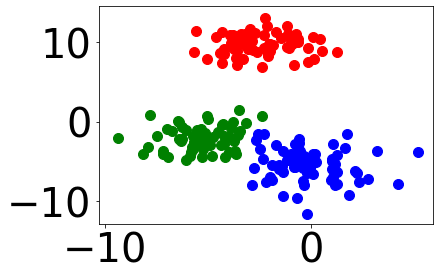

In [38]:
plt.scatter(points[y_hc==0,0], points[y_hc==0,1], s=100, c='blue')
plt.scatter(points[y_hc==1,0], points[y_hc==1,1], s=100, c='red')
plt.scatter(points[y_hc==2,0], points[y_hc==2,1], s=100, c='green')